# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [30]:
# if plotnine is not installed in Jupter then use the following command to install it 

Running this project require the following imports 

In [31]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
%matplotlib inline

In [32]:
# helper function that allows us to display data in 2 dimensions and highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



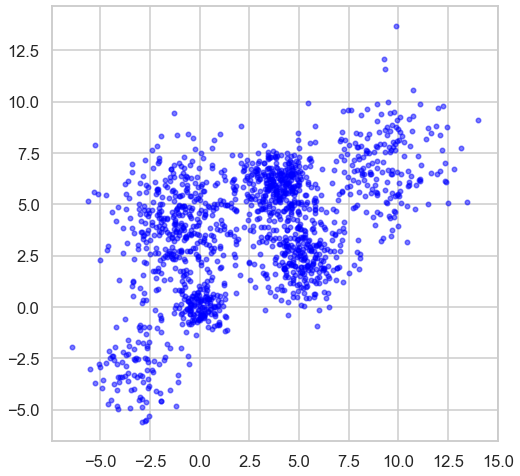

In [33]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

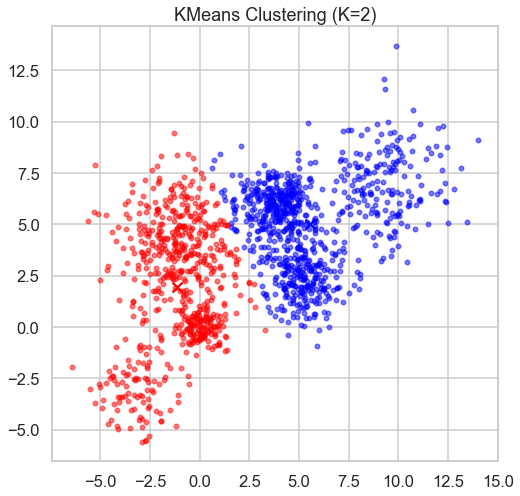

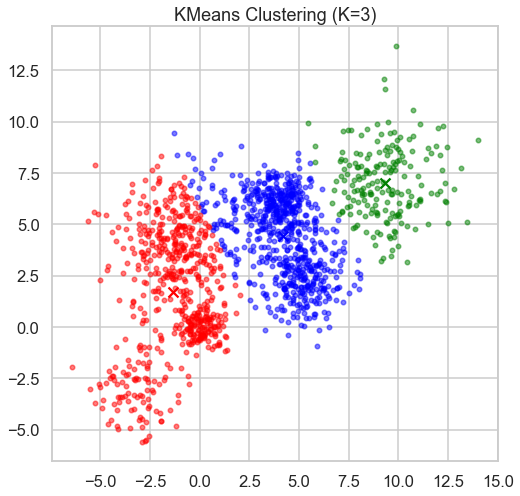

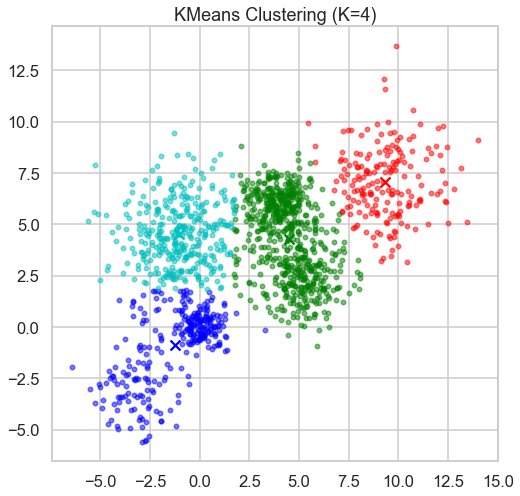

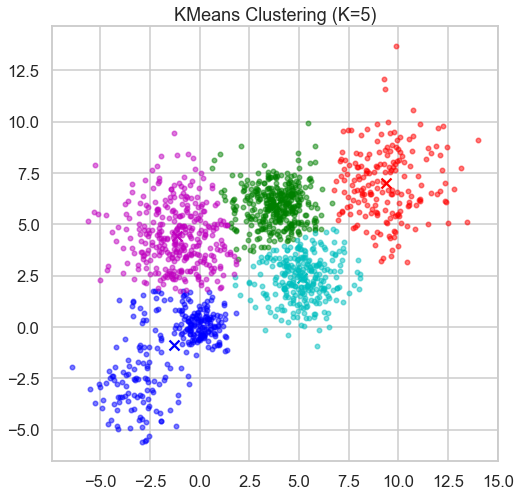

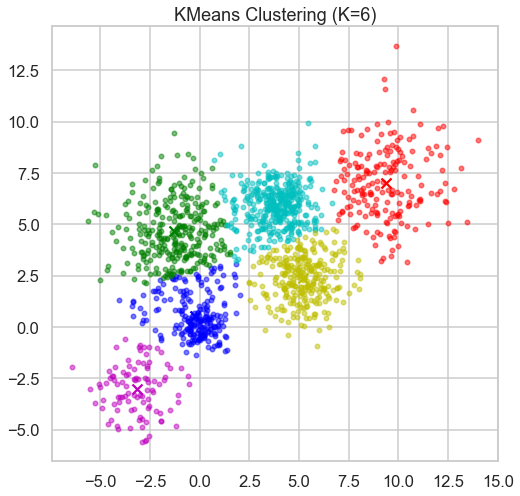

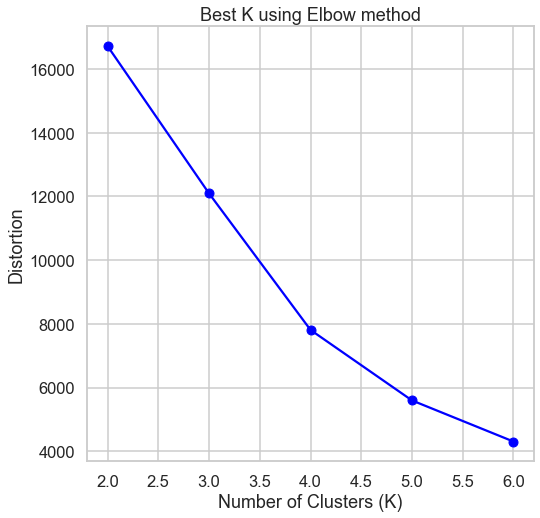

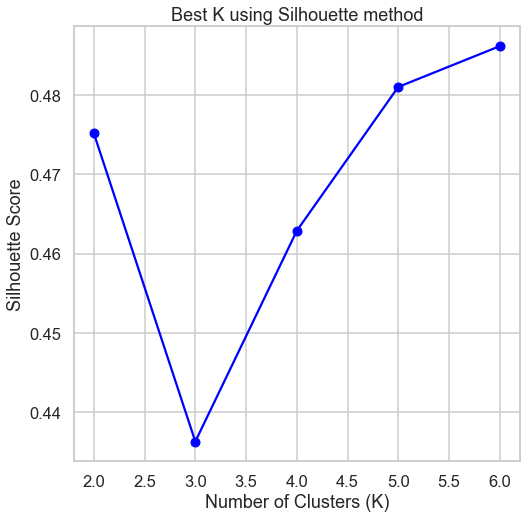

Best value of K: 6


In [34]:
distortions = []
silhouette_scores = []

#using k values ranging from 2 to 6 to cluster the above data
for k in range(2, 7):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Multi_blob_Data)
    distortions.append(kmeans.inertia_)
    display_cluster(Multi_blob_Data, kmeans, k)
    plt.title(f'KMeans Clustering (K={k})')
    #here we can see the kmeans clustering from 2 to 6
    plt.show()
    silhouette_scores.append(silhouette_score(Multi_blob_Data, kmeans.labels_))
    
#here the elbow method with the best k plotted
plt.plot(range(2, 7), distortions, 'bo-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.title('Best K using Elbow method')
plt.show()

#here the silhouette method with the best k plotted
plt.plot(range(2, 7), silhouette_scores, 'bo-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Best K using Silhouette method')
plt.show()

#Store the silhouette_score for the best K
best_k = np.argmax(silhouette_scores) + 2
print(f"Best value of K: {best_k}")

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

Best parameters: ('euclidean', 'average'), silhouette score: 0.41478815574933364


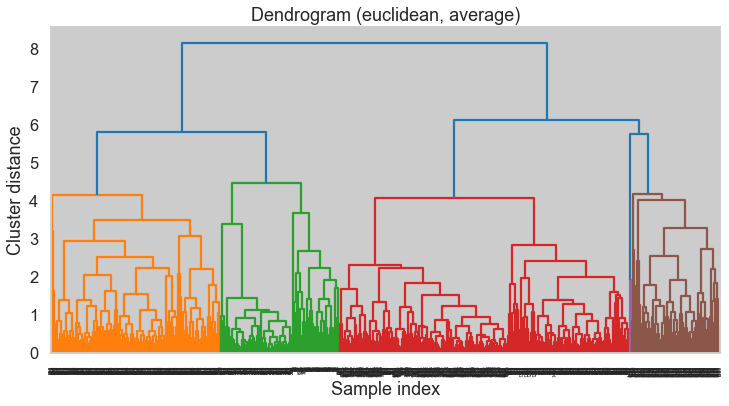

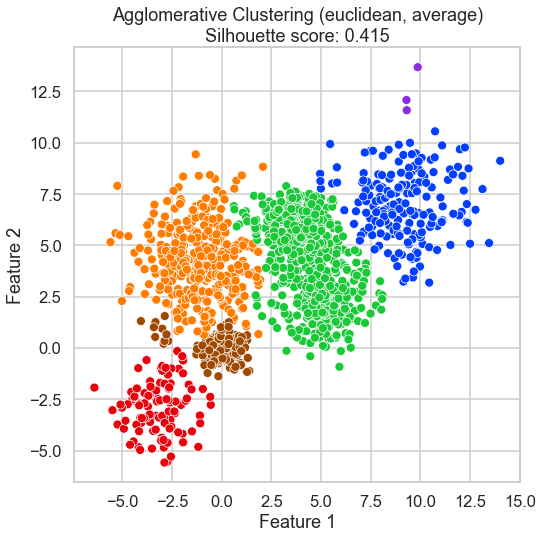

In [29]:
# Define parameter combinations to try
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [None, 1,2,3]

best_silhouette_score = -1

for affinity in affinities:
    for linkage in linkages:
        for distance_threshold in distance_thresholds:
            # Perform hierarchical clustering
            model = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage, distance_threshold=distance_threshold)
            model.fit(Multi_blob_Data)
            
            # Compute silhouette score
            labels = model.labels_
            silhouette = silhouette_score(Multi_blob_Data, labels)
            print(f'Affinity: {affinity}, Linkage: {linkage}, Distance threshold: {distance_threshold}, Silhouette score: {silhouette:.3f}')
            
            # Store the best silhouette score and resulting clusters
            if silhouette > best_silhouette_score:
                best_silhouette_score = silhouette
                best_model = model
                
                # Plot dendrogram
                plt.figure(figsize=(10, 5))
                plt.title(f'Dendrogram ({affinity}, {linkage}, {distance_threshold})')
                dendrogram(model.children_, labels=labels)
                plt.show()
                
                # Plot resulting clusters
                plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=labels)
                plt.title(f'Clusters ({affinity}, {linkage}, {distance_threshold})')
                plt.show()

print(f'Best silhouette score: {best_silhouette_score:.3f}')

### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

Best Silhouette Score: 0.47, eps=2.10, min_samples=10


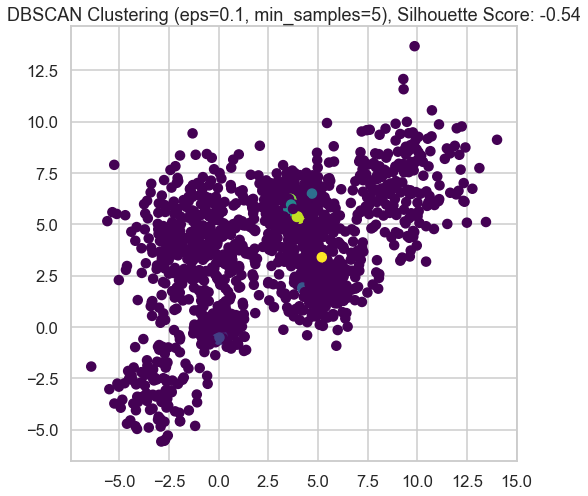

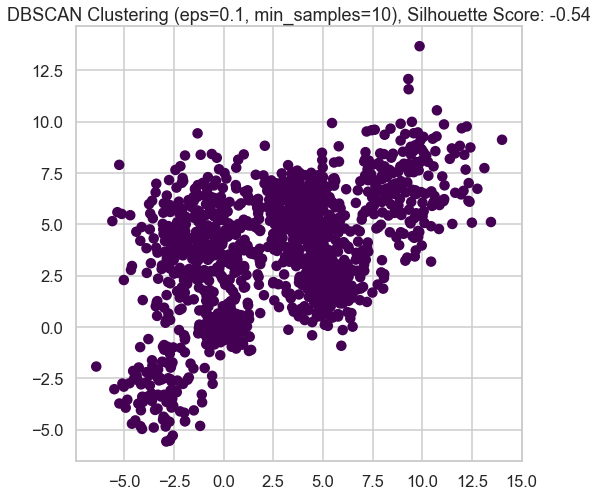

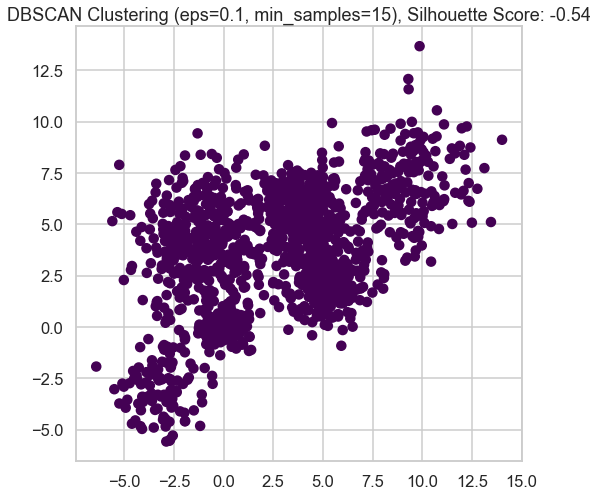

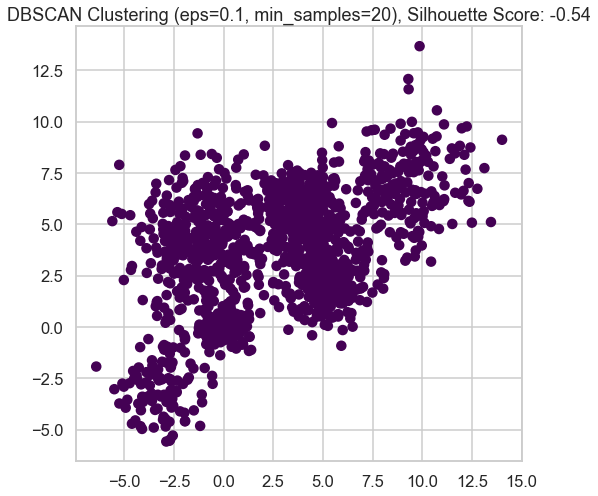

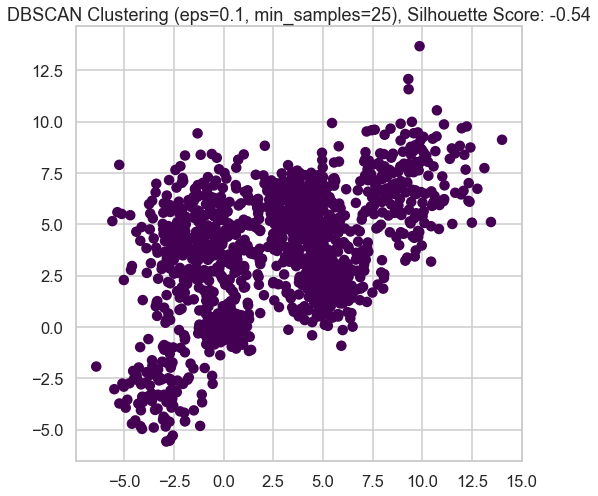

...

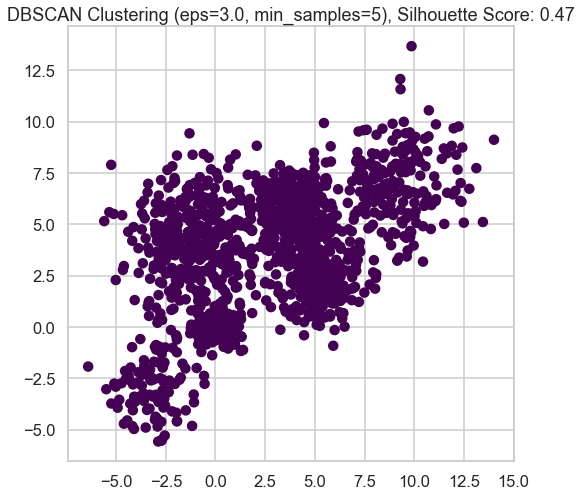

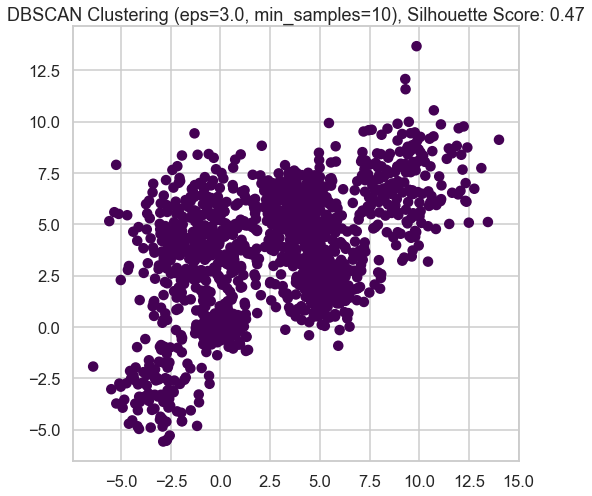

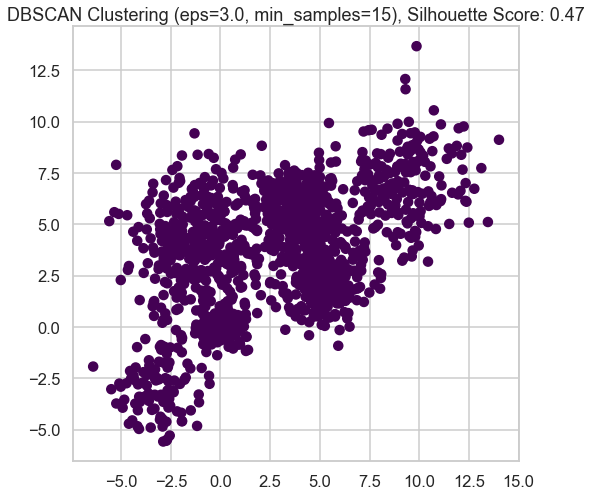

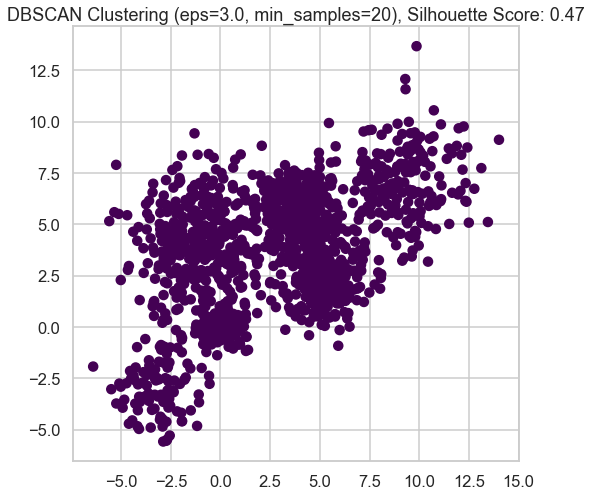

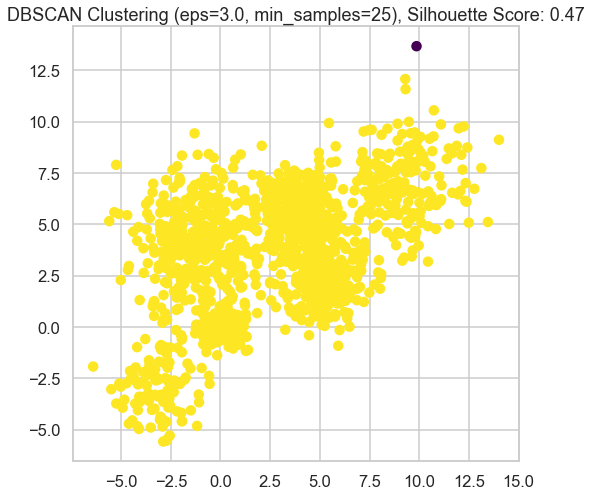

In [39]:
def display_cluster(X, cluster_labels, title):
    plt.figure()
    plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='viridis')
    plt.title(title)

eps_range = np.linspace(0.1, 3, 30)
min_samples_range = np.arange(5, 26, 5)
best_silhouette_score = -1

for eps in eps_range:
    for min_samples in min_samples_range:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(Multi_blob_Data)
        if len(set(cluster_labels)) > 1:
            silhouette_avg = silhouette_score(Multi_blob_Data, cluster_labels)
            # finding result in the best silhouette_score
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_eps = eps
                best_min_samples = min_samples
        title = f"DBSCAN Clustering (eps={eps}, min_samples={min_samples}), Silhouette Score: {silhouette_avg:.2f}"
        display_cluster(Multi_blob_Data, cluster_labels, title)

print(f"Best Silhouette Score: {best_silhouette_score:.2f}, eps={best_eps:.2f}, min_samples={best_min_samples}")


### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

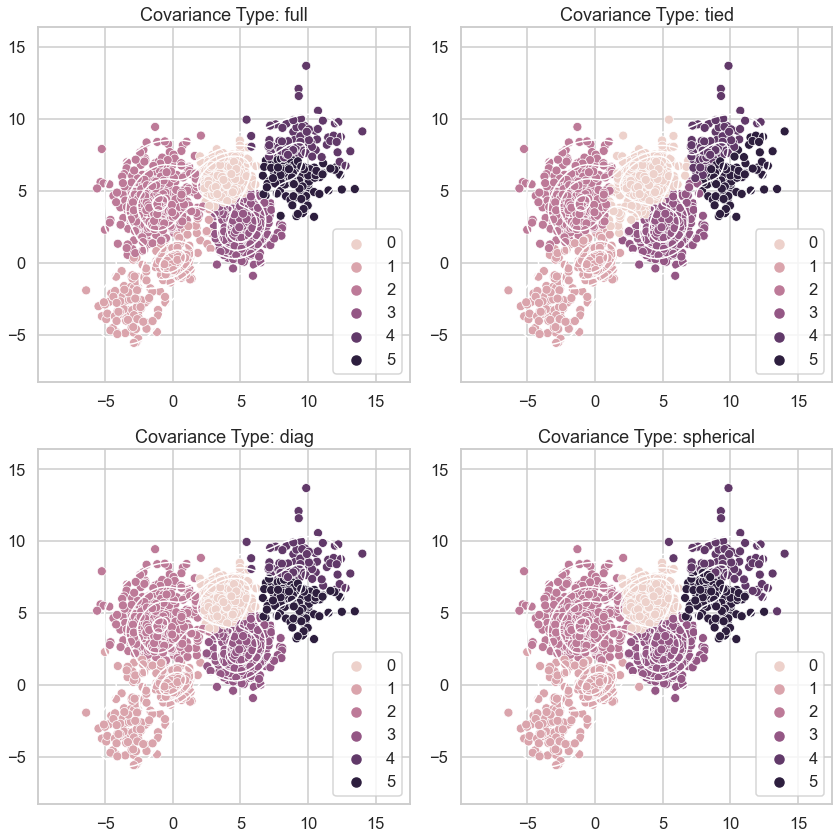

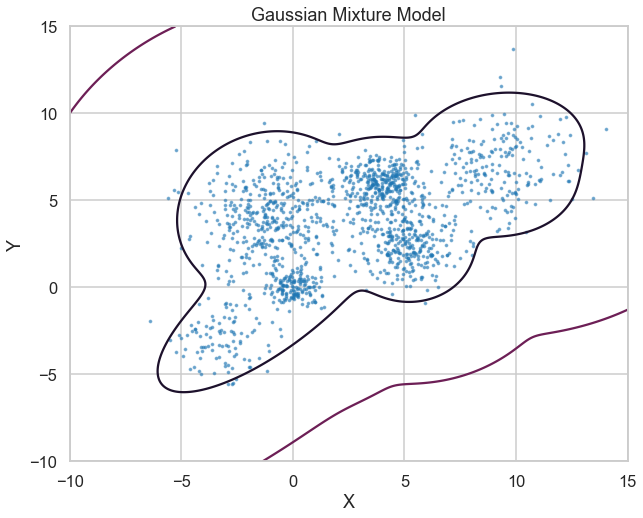

In [50]:
from sklearn.mixture import GaussianMixture
n_clusters = 6
covariance_types = ['full', 'tied', 'diag', 'spherical']

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.ravel()
for i, cov_type in enumerate(covariance_types):
    gmm = GaussianMixture(n_components=n_clusters, covariance_type=cov_type, random_state=42)
    gmm.fit(Multi_blob_Data)
    labels = gmm.predict(Multi_blob_Data)
    sns.scatterplot(x=Multi_blob_Data[:,0], y=Multi_blob_Data[:,1], hue=labels, ax=axes[i])
    sns.kdeplot(x=Multi_blob_Data[:,0], y=Multi_blob_Data[:,1], levels=5, color='w', linewidths=1.5, ax=axes[i])
    axes[i].set_title('Covariance Type: {}'.format(cov_type))
plt.tight_layout()
plt.show()

gmm = GaussianMixture(n_components=n_clusters, covariance_type='full', random_state=42)
gmm.fit(Multi_blob_Data)

x_range = np.linspace(-10, 15, 500)
y_range = np.linspace(-10, 15, 500)
X, Y = np.meshgrid(x_range, y_range)
Z = -gmm.score_samples(np.array([X.ravel(), Y.ravel()]).T)
Z = Z.reshape(X.shape)

plt.figure(figsize=(10, 8))
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], s=5, alpha=0.5)
plt.contour(X, Y, Z, levels=np.logspace(-3, 2, 10))
plt.title('Gaussian Mixture Model')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [16]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Customer dataset
Repeat all the above on the customer data set 